In [21]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import ast
import re
import pickle

In [22]:
df = pd.read_csv('../Dataset/largeClass.csv')

In [23]:
df.sample(5)

,Code,Smell
250,\r\npackage dictionary;\r\n\r\nimport java.io....,0
133,\r\npackage project;\r\n\r\nimport java.awt.Co...,1
160,\r\npackage projectsms;\r\n\r\nimport java.awt...,0
261,\r\npackage Spl_project;\r\n\r\n\r\nimport jav...,0
72,\r\npackage sub_class;\r\n//The very first fra...,1


In [24]:
from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()

In [25]:
df['Smell'] = encoder.fit_transform(df['Smell'])
df['Smell'].value_counts()

Smell
0    165
1    132
Name: count, dtype: int64

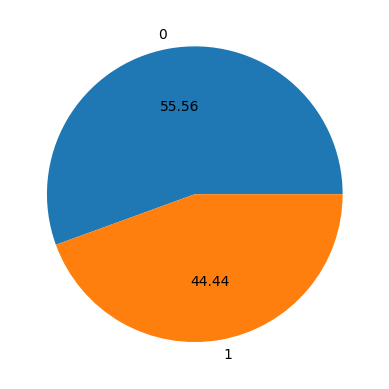

In [26]:
plt.pie(df['Smell'].value_counts(), labels=['0','1'],autopct="%0.2f")
plt.show()

In [27]:
!pip install javalang

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com



[notice] A new release of pip is available: 23.1.2 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [28]:
import javalang

In [29]:
def parse_code_to_ast(code):
    try:
        return javalang.parse.parse(code)
    except (javalang.parser.JavaSyntaxError, javalang.tokenizer.LexerError) as e:
        print(f"Error parsing code: {e}")
        return None

In [30]:
def count_attributes_from_ast(ast_tree):
    if ast_tree is None:
        return 0

    attributes_count = 0

    for _, node in ast_tree:
        if isinstance(node, javalang.tree.FieldDeclaration):
            attributes_count += len(node.declarators)

    return attributes_count

In [31]:
def count_loc_from_code(code):
    lines = code.splitlines()
    single_line_comment = re.compile(r'^\s*//')
    multi_line_comment_start = re.compile(r'^\s*/\*')
    multi_line_comment_end = re.compile(r'^\s*\*/')

    in_multi_line_comment = False
    loc = 0

    for line in lines:
        line = line.strip()

        if in_multi_line_comment:
            if multi_line_comment_end.match(line):
                in_multi_line_comment = False
            continue

        if multi_line_comment_start.match(line):
            in_multi_line_comment = True
            continue

        if line and not single_line_comment.match(line):
            loc += 1

    return loc

In [32]:
df['AST'] = df['Code'].apply(parse_code_to_ast)
df['Attributes'] = df['AST'].apply(count_attributes_from_ast)
df['LOC'] = df['Code'].apply(count_loc_from_code)

Error parsing code: 
Error parsing code: 


In [33]:
for ast_tree in df['AST']:
    print(ast_tree)
    print("\n")

CompilationUnit(imports=[Import(path=javax.swing, static=False, wildcard=True), Import(path=java.awt, static=False, wildcard=True), Import(path=java.awt.event, static=False, wildcard=True), Import(path=java.io.File, static=False, wildcard=False), Import(path=java.io.IOException, static=False, wildcard=False)], package=None, types=[ClassDeclaration(annotations=[], body=[FieldDeclaration(annotations=[], declarators=[VariableDeclarator(dimensions=[], initializer=None, name=file_read_button), VariableDeclarator(dimensions=[], initializer=None, name=file_check_button)], documentation=None, modifiers={'private'}, type=ReferenceType(arguments=None, dimensions=[], name=JButton, sub_type=None)), FieldDeclaration(annotations=[], declarators=[VariableDeclarator(dimensions=[], initializer=None, name=text), VariableDeclarator(dimensions=[], initializer=None, name=result_textarea)], documentation=None, modifiers={'private'}, type=ReferenceType(arguments=None, dimensions=[], name=JTextArea, sub_type=

In [34]:
print(df[['Code','Attributes','LOC']])

                                                  Code  Attributes  LOC
0    import javax.swing.*;\nimport java.awt.*;\nimp...          15  180
1    public class Car {\r\n    private String make;...           6   61
2    import javax.swing.*;\nimport java.awt.*;\nimp...          12  199
3    public class MathOperations {\r\n\r\n    publi...           0    8
4    import java.util.Map;\r\n\r\npublic class TaxA...           0   21
..                                                 ...         ...  ...
292  public class Laptop {\r\n    private String br...          11   34
293  public class Laptop {\r\n    private String br...          10   33
294  public class MobilePhone {\r\n    private Stri...          11   36
295  public class MobilePhone {\r\n    private Stri...          10   35
296  public class MobilePhone {\r\n    private Stri...           9   34

[297 rows x 3 columns]


In [35]:
df.head(27)

,Code,Smell,AST,Attributes,LOC
0,import javax.swing.*;\nimport java.awt.*;\nimp...,1,CompilationUnit(imports=[Import(path=javax.swi...,15,180
1,public class Car {\r\n private String make;...,0,"CompilationUnit(imports=[], package=None, type...",6,61
2,import javax.swing.*;\nimport java.awt.*;\nimp...,1,CompilationUnit(imports=[Import(path=javax.swi...,12,199
3,public class MathOperations {\r\n\r\n publi...,0,"CompilationUnit(imports=[], package=None, type...",0,8
4,import java.util.Map;\r\n\r\npublic class TaxA...,0,CompilationUnit(imports=[Import(path=java.util...,0,21
5,import java.util.Map;\r\n\r\npublic class Data...,0,CompilationUnit(imports=[Import(path=java.util...,0,17
6,import java.util.HashMap;\r\n\r\nclass Solutio...,0,CompilationUnit(imports=[Import(path=java.util...,0,14
7,public class Solution {\r\n\r\n public int[...,0,"CompilationUnit(imports=[], package=None, type...",0,15
8,public class RectangleCalculator {\r\n\r\n ...,0,"CompilationUnit(imports=[], package=None, type...",0,8
9,public class ArrayStats {\r\n\r\n private s...,0,"CompilationUnit(imports=[], package=None, type...",2,18


In [36]:
X = df[["LOC", "Attributes"]]
y = df['Smell'].values

In [37]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=2)

In [38]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score,confusion_matrix,precision_score

In [39]:
lrc = LogisticRegression()
lrc.fit(X_train,y_train)
y_pred1 = lrc.predict(X_test)
print(accuracy_score(y_test,y_pred1))

0.9666666666666667


In [40]:
def test_model(code, model, encoder):
    """
    Test the trained model with a sample Java code.

    Parameters:
    - code (str): The Java code to be tested.
    - model: The trained model (e.g., GaussianNB).
    - encoder: The LabelEncoder used for encoding the target labels.

    Returns:
    - str: The predicted class label for the input code.
    """

    ast_tree = parse_code_to_ast(code)
    attributes = count_attributes_from_ast(ast_tree)
    loc = count_loc_from_code(code)
    X_test_sample = np.array([[loc, attributes]])
    prediction = model.predict(X_test_sample)
    predicted_label = encoder.inverse_transform(prediction)[0]

    return predicted_label

sample_code = """
import javax.swing.*;
import java.awt.*;
import java.awt.event.ActionEvent;
import java.awt.event.ActionListener;

public class Cricket_Calculator extends Frame_Setup {
    public JPanel button_panel;
    public JButton one_day_match_button, t20_match_button, test_match_button, home_button;
    private JLabel null_label; // Assuming this is declared in the parent class Frame_Setup
    private ImageIcon one_day_match_button_icon; // Assuming these are attributes
    private ImageIcon t20_match_button_icon; // Assuming these are attributes
    private ImageIcon test_match_button_icon; // Assuming these are attributes
    private ImageIcon button_home_icon; // Assuming these are attributes

    public Cricket_Calculator(String page_title) {
        super(page_title); // Here we are using super key to use parent class's constructor
        setContainer();
        setButtonPanel();
        setButtons();
        setActionListeners();
    }

    public void setContainer() {
        // Method Overriding Concept Used
        super.setContainer(); // Here we get setContainer() of parent class
        container.setLayout(new BorderLayout(70, 50)); // 70 is Horizontal gap and 50 is Vertical Gap
        container.setBackground(Color.white);
    }

    public void setButtonPanel() {
        button_panel = new JPanel();
        button_panel.setLayout(new GridLayout(4, 1));
        button_panel.setBackground(Color.WHITE);
        container.add(button_panel, BorderLayout.CENTER);
        setNullLabel();
    }

    public void setButtons() {
        one_day_match_button = new JButton(one_day_match_button_icon);
        one_day_match_button.setBackground(Color.WHITE);
        one_day_match_button.setBorder(null);
        one_day_match_button.setFocusPainted(false);
        button_panel.add(one_day_match_button);

        t20_match_button = new JButton(t20_match_button_icon);
        t20_match_button.setBackground(Color.WHITE);
        t20_match_button.setBorder(null);
        t20_match_button.setFocusPainted(false);
        button_panel.add(t20_match_button);

        test_match_button = new JButton(test_match_button_icon);
        test_match_button.setBackground(Color.WHITE);
        test_match_button.setBorder(null);
        test_match_button.setFocusPainted(false);
        button_panel.add(test_match_button);

        home_button = new JButton(button_home_icon);
        home_button.setBackground(Color.WHITE);
        home_button.setBorder(null);
        home_button.setFocusPainted(false);
        button_panel.add(home_button);
    }

    public void setActionListeners() {
        one_day_match_button.addActionListener(new ActionListener() {
            public void actionPerformed(ActionEvent e) {
                dispose();
                Cricket_Mode frame = new Cricket_Mode("Cricket_Mode", "One Day Match");
                frame.setVisible(true);
            }
        });

        t20_match_button.addActionListener(new ActionListener() {
            public void actionPerformed(ActionEvent e) {
                dispose();
                Cricket_Mode frame = new Cricket_Mode("Cricket_Mode", "T20 Match");
                frame.setVisible(true);
            }
        });

        test_match_button.addActionListener(new ActionListener() {
            public void actionPerformed(ActionEvent e) {
                dispose();
                Cricket_Mode frame = new Cricket_Mode("Cricket_Mode", "Test Match");
                frame.setVisible(true);
            }
        });

        home_button.addActionListener(new ActionListener() {
            public void actionPerformed(ActionEvent e) {
                dispose();
                Home frame = new Home("Home");
                frame.setVisible(true);
            }
        });
    }

    public void setNullLabel() {
        null_label = new JLabel();
        container.add(null_label, BorderLayout.EAST);
        null_label = new JLabel();
        container.add(null_label, BorderLayout.WEST);
        null_label = new JLabel();
        container.add(null_label, BorderLayout.NORTH);
        null_label = new JLabel();
        container.add(null_label, BorderLayout.SOUTH);
    }

    /*public static void main(String[] args) {
        Cricket_Calculator frame = new Cricket_Calculator("Cricket Mode");
        frame.setVisible(true);
    }*/
}

"""
predicted_smell = test_model(sample_code, lrc, encoder)
print(f"Predicted smell for the sample code: {predicted_smell}")

Predicted smell for the sample code: 0


c:\Users\User\Desktop\streamlit\env\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


In [42]:
with open('large_class.pkl', 'wb') as model_file:
    pickle.dump(lrc, model_file)